# Find Inference Hyperparameters for Pooled Lung Cancer Control Group

## Show control group data

In [1]:
import erlotinib as erlo

# Get data
data = erlo.DataLibrary().lung_cancer_control_group()

# Create scatter plot
fig = erlo.plots.PDTimeSeriesPlot()
fig.add_data(data, biomarker='Tumour volume')
fig.set_axis_labels(xlabel=r'$\text{Time in day}$', ylabel=r'$\text{Tumour volume in cm}^3$')

# Show figure
fig.show()

**Figure 1:** Visualisation of the measured tumour growth in 8 mice with patient-derived lung cancer implants.

## Build model

In [2]:
# Define mechanistic model
path = erlo.ModelLibrary().tumour_growth_inhibition_model_koch_reparametrised()
mechanistic_model = erlo.PharmacodynamicModel(path)
mechanistic_model.set_parameter_names(names={
    'myokit.tumour_volume': 'Tumour volume in cm^3',
    'myokit.critical_volume': 'Critical volume in cm^3',
    'myokit.drug_concentration': 'Drug concentration in mg/L',
    'myokit.kappa': 'Potency in L/mg/day',
    'myokit.lambda': 'Exponential growth rate in 1/day'})

# Define error model
error_model = erlo.ConstantAndMultiplicativeGaussianErrorModel()

# Define population model
population_models = [
    erlo.PooledModel(),  # Initial tumour volume
    erlo.PooledModel(),  # Critical volume
    erlo.PooledModel(),  # Growth rate
    erlo.PooledModel(),  # Sigma base
    erlo.PooledModel()]  # Sigma rel.

# Compose model and not identified parameters
problem = erlo.ProblemModellingController(mechanistic_model, error_model)
problem.fix_parameters({
    'Drug concentration in mg/L': 0,
    'Potency in L/mg/day': 0})
problem.set_population_model(population_models)

## Prior Predictive Check

In [3]:
import numpy as np
import pints

# Define prior distribution
log_priors = [
    pints.TruncatedGaussianLogPrior(mean=0.25, sd=0.1, a=0, b=np.inf),   # Pooled Initial tumour volume
    pints.TruncatedGaussianLogPrior(mean=1, sd=1, a=0, b=np.inf),        # Pooled Critical volume
    pints.TruncatedGaussianLogPrior(mean=0.1, sd=0.1, a=0, b=np.inf),    # Pooled Growth rate
    pints.TruncatedGaussianLogPrior(mean=0, sd=0.1, a=0, b=np.inf),      # Pooled Sigma base
    pints.TruncatedGaussianLogPrior(mean=0, sd=1, a=0, b=np.inf)]        # Pooled Sigma rel.
log_prior = pints.ComposedLogPrior(*log_priors)

# Compose prior predictive model
predictive_model = problem.get_predictive_model(exclude_pop_model=True)
prior_predictive_model = erlo.PriorPredictiveModel(
    predictive_model, log_prior)

# Sample from prior predictive model
times = np.linspace(0, 30)
n_samples = 1000
samples = prior_predictive_model.sample(times, n_samples)

# Illustrate prior predictive model
fig = erlo.plots.PDPredictivePlot()
fig.add_prediction(data=samples, bulk_probs=[0.3, 0.6, 0.9])
fig.set_axis_labels(xlabel=r'$\text{Time in day}$', ylabel=r'$\text{Tumour volume in cm}^3$')
fig.show()

**Figure 2:** Prior predictive model of tumour volume measurement over time. The shaded areas estimate the 0.3, 0.6 and 0.9 bulk probability of the prior predictive distribution by sampling 1000 virtual "measurements" at each of the 50 equidistant time points.

## Find posterior probability distribution

In [22]:
# Create log-posteriors
problem.set_data(data, output_biomarker_dict={'myokit.tumour_volume': 'Tumour volume'})
problem.set_log_prior(log_priors)
log_posterior = problem.get_log_posterior()

# Set up sampling controller
sampler = erlo.SamplingController(log_posterior)
sampler.set_sampler(pints.HamiltonianMCMC)
sampler.set_transform(transform=pints.LogTransformation(n_parameters=5))
sampler.set_n_runs(5)

# Run sampling
n_iterations = 1000
hyperparameters = [10, [0.1, 0.15, 0.15, 0.2, 0.1]]
posterior_samples = sampler.run(n_iterations=n_iterations, hyperparameters=hyperparameters, show_progress_bar=True, log_to_screen=True)

Using Hamiltonian Monte Carlo
Generating 5 chains.
Running in parallel with 5 worker processess.
Iter. Eval. Accept.   Accept.   Accept.   Accept.   Accept.   Time m:s
0     5      0         0         0         0         0          0:16.4
1     55     0.333     0.333     0.333     0.333     0.333      0:16.5
2     105    0.5       0.5       0.5       0.5       0.5        0:16.6
/Users/david/Documents/SABS/DPhil/erlotinib/venv/lib/python3.7/site-packages/pints/_mcmc/_hamiltonian.py:363: RuntimeWarning:

overflow encountered in exp

3     155    0.6       0.6       0.6       0.6       0.6        0:16.7
20    1005   0.909     0.864     0.909     0.909     0.909      0:17.9
40    2005   0.952381  0.929     0.929     0.952381  0.952381   0:19.4
60    3005   0.968     0.952     0.952     0.968     0.968      0:36.1
80    4005   0.976     0.963     0.963     0.976     0.963      0:37.7
100   5005   0.98      0.971     0.971     0.98      0.971      0:54.8
120   6005   0.984     0.975     0.97

## Analyse convergence

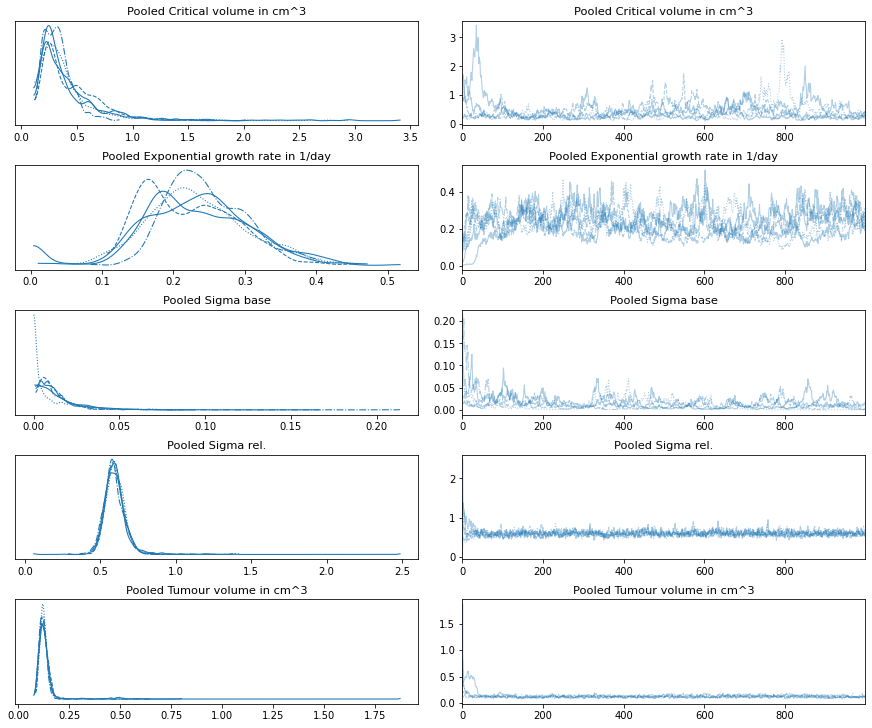

In [23]:
import arviz as az
import matplotlib.pyplot as plt

az.plot_trace(posterior_samples)
plt.show()

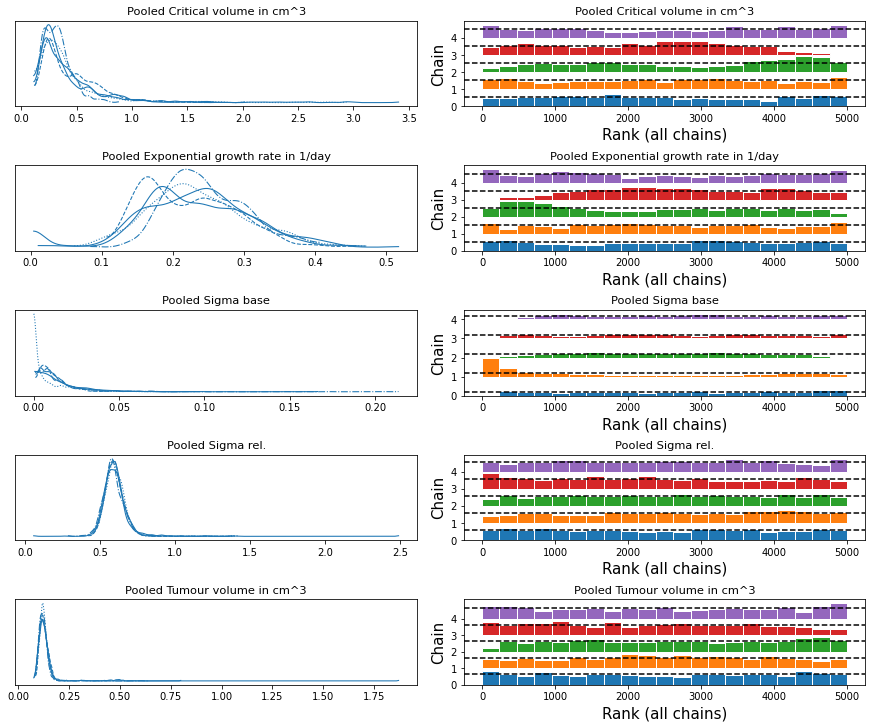

In [24]:
az.plot_trace(posterior_samples, kind='rank_bars')
plt.show()

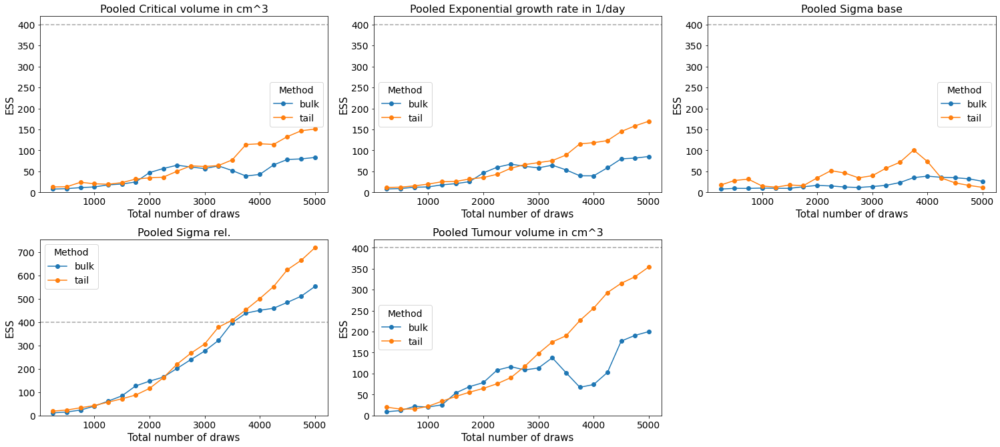

In [25]:
az.plot_ess(posterior_samples, kind="evolution")
plt.show()

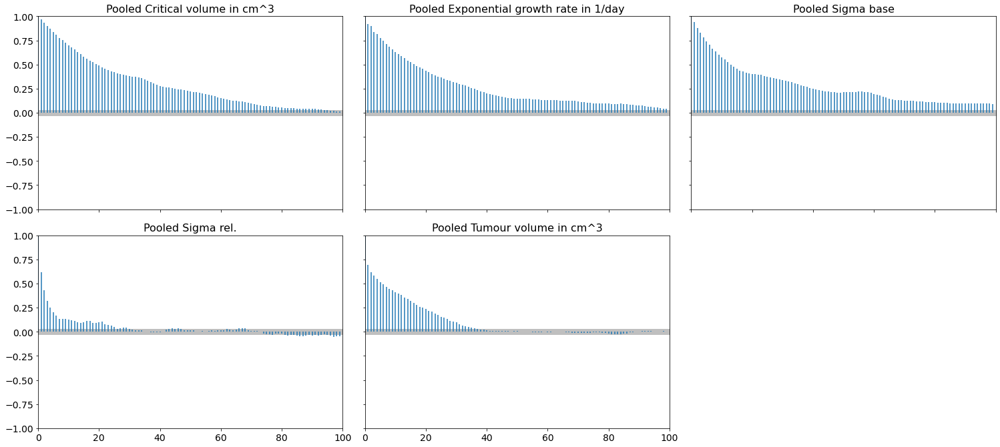

In [26]:
az.plot_autocorr(posterior_samples, combined=True)
plt.show()

### Exclude warmup

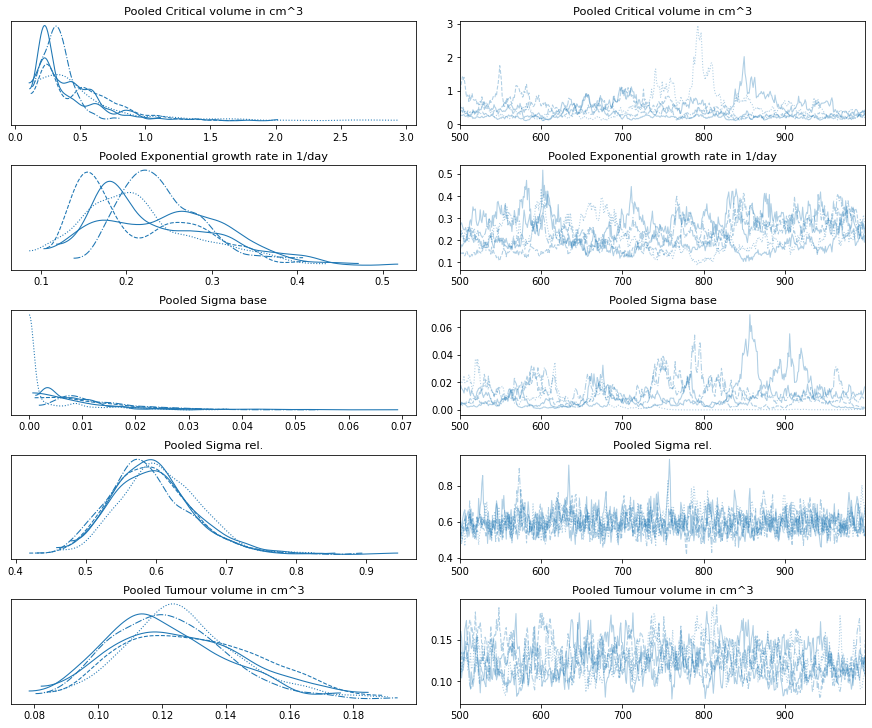

In [27]:
warmup = 500

az.plot_trace(posterior_samples.sel(draw=slice(warmup, n_iterations)))
plt.show()

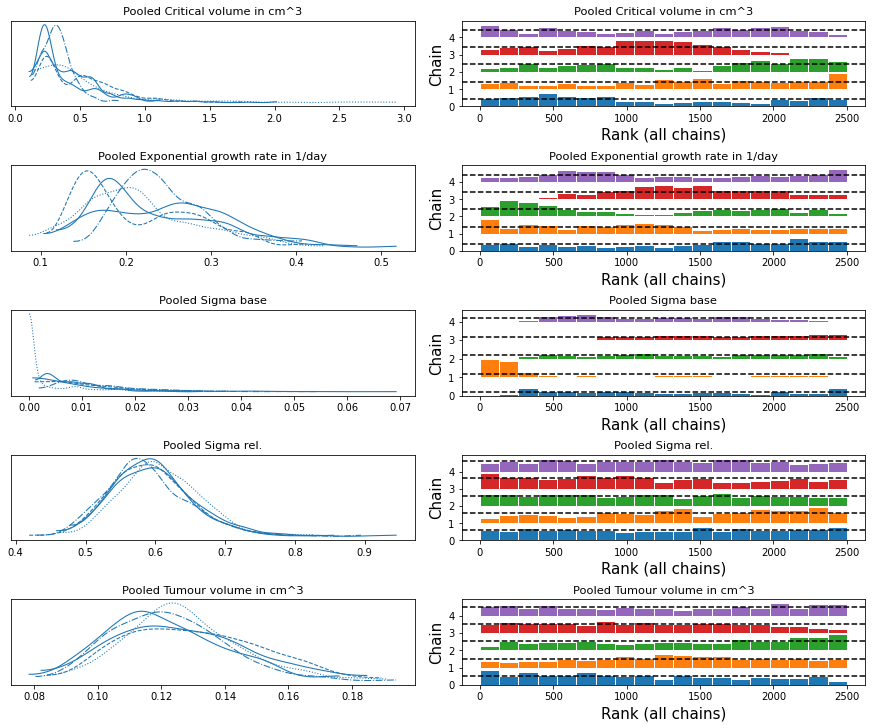

In [28]:
az.plot_trace(posterior_samples.sel(draw=slice(warmup, n_iterations)), kind='rank_bars')
plt.show()

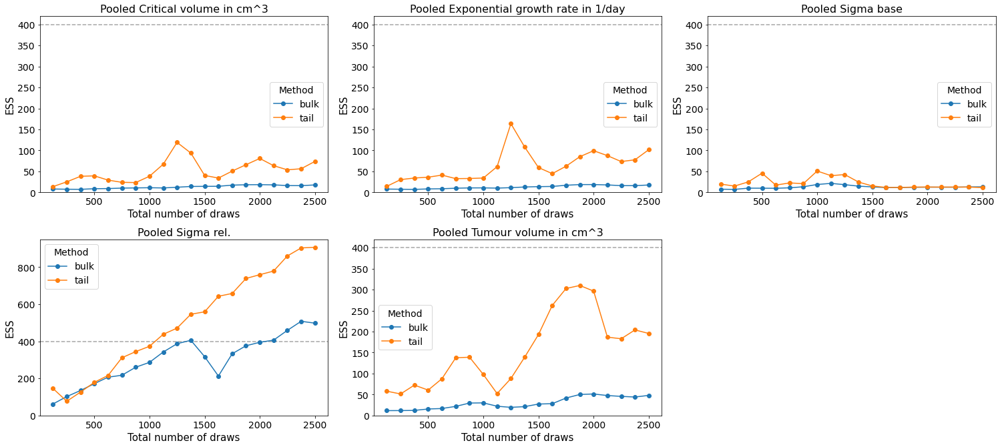

In [29]:
az.plot_ess(posterior_samples.sel(draw=slice(warmup, n_iterations)), kind="evolution")
plt.show()

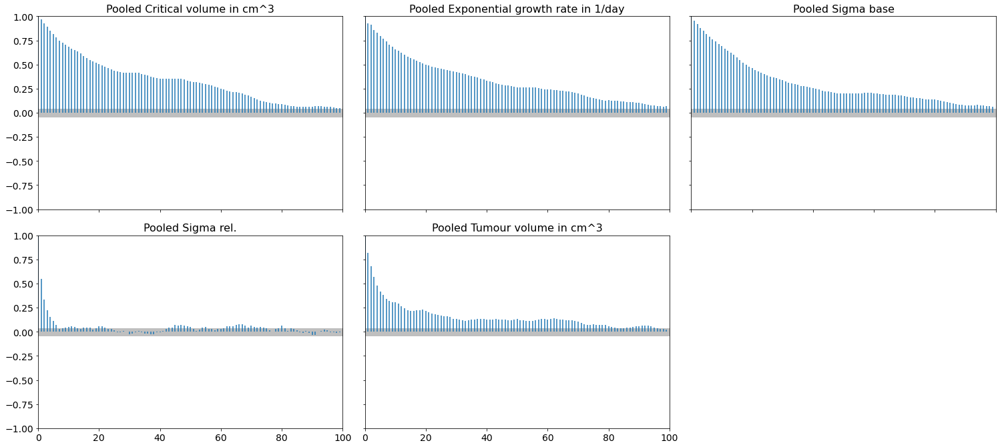

In [30]:
az.plot_autocorr(posterior_samples.sel(draw=slice(warmup, n_iterations)), combined=True)
plt.show()

### Reduce correlations by thinning out

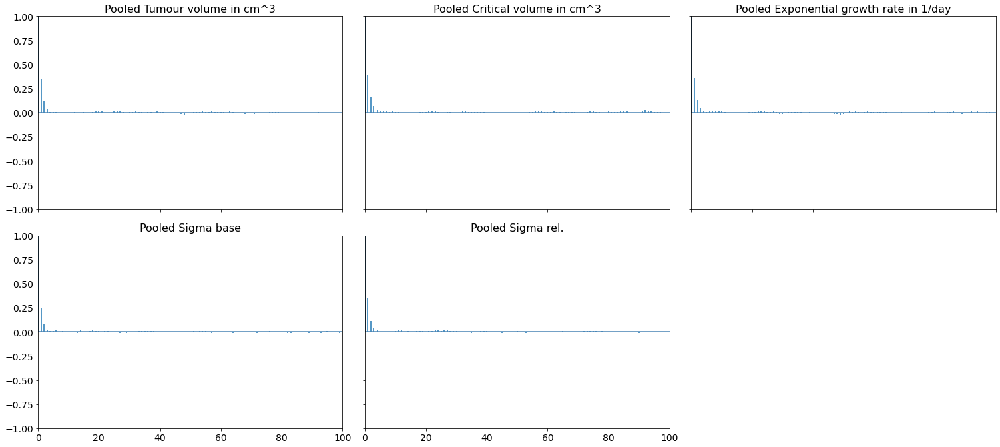

In [16]:
thinning_ratio = 10

az.plot_autocorr(xarray_samples.sel(draw=slice(warmup, n_iterations, thinning_ratio)), combined=True)
plt.show()

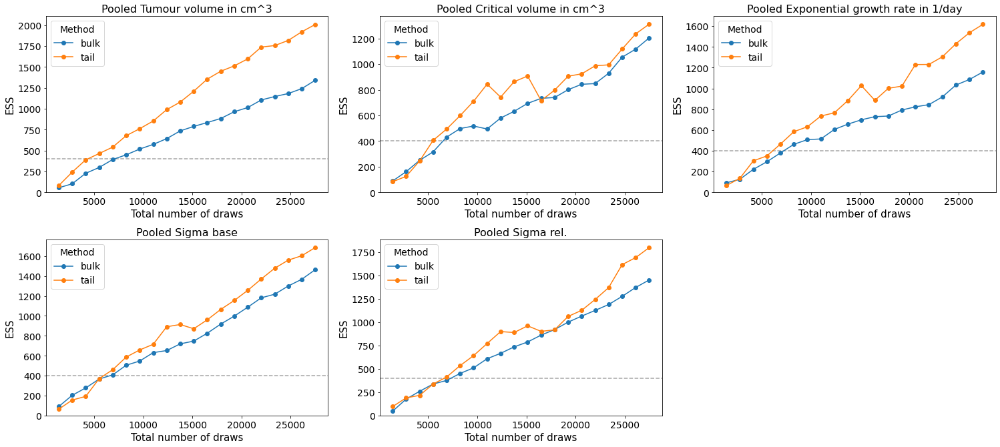

In [17]:
az.plot_ess(xarray_samples.sel(draw=slice(warmup, n_iterations, thinning_ratio)), kind="evolution")
plt.show()

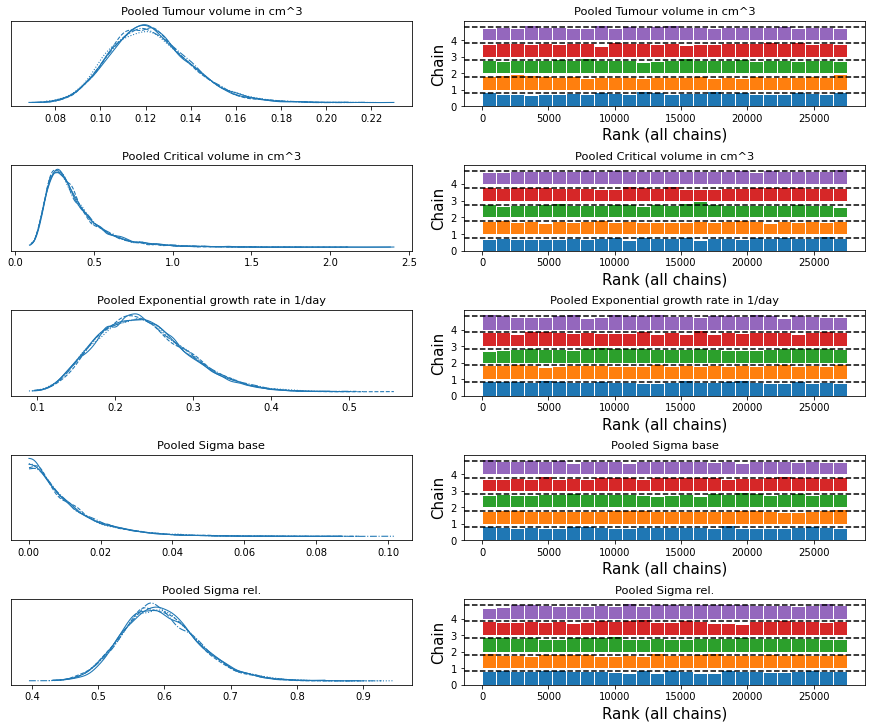

In [18]:
az.plot_trace(xarray_samples.sel(draw=slice(warmup, n_iterations, thinning_ratio)), kind='rank_bars')
plt.show()

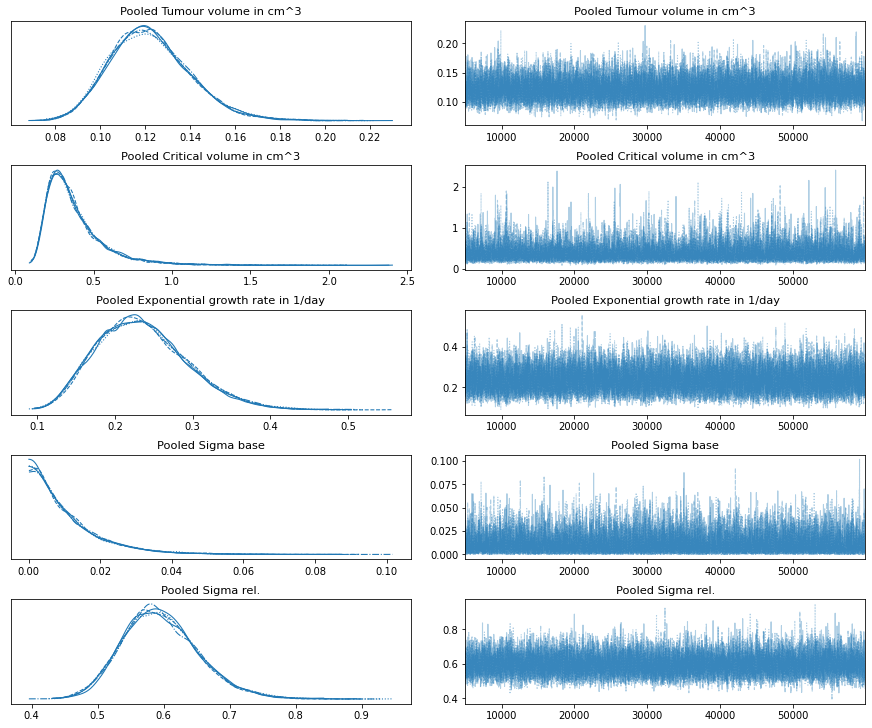

In [19]:
az.plot_trace(xarray_samples.sel(draw=slice(warmup, n_iterations, thinning_ratio)))
plt.show()

## Save posterior

In [21]:
import os

# Rename parameters
temp = xarray_samples.rename({
    'Pooled Tumour volume in cm^3': 'pooled_initial_tumour_volume',
    'Pooled Critical volume in cm^3': 'pooled_critical_volume',
    'Pooled Exponential growth rate in 1/day': 'pooled_growth_rate',
    'Pooled Sigma base': 'pooled_sigma_base',
    'Pooled Sigma rel.': 'pooled_sigma_rel'})

# Export samples
directory = os.getcwd()
name = '/posteriors/pooled_hmc.nc'
temp.sel(draw=slice(warmup, n_iterations, thinning_ratio)).to_netcdf(directory + name)